# Unsupervised Anomaly Detection

> ##### Load Data

In [4]:
import json
import pandas as pd
from datetime import datetime
import ipaddress

datafile = './data/collect_log_ba_202304071701.json'

with open( datafile, 'r', encoding='utf-8' ) as f:
    data = json.loads(f.read())

df = pd.json_normalize( data, record_path=['collect_log_ba'] )
df.head( 3 )


,log_seq,user_id,user_name,dept_id,dept_name,log_time,req_type,req_url,log_type_cd,user_ip,proc_date,proc_time,system_seq,normal_flag
0,22315,USER0,이름0,DEPT10003,부서명10003,2023-01-01T00:12:03.000Z,등록,www.easycerti.com,cl,192.168.0.18,20230101,09120,5,0
1,22316,USER5,이름5,DEPT10008,부서명10008,2023-01-01T03:02:11.000Z,등록,www.easycerti.com/view/detial,cl,192.222.0.16,20230101,12021,1,0
2,22317,USER1,이름1,DEPT10004,부서명10004,2023-01-01T08:04:23.000Z,조회,www.test.com,dn,192.18.0.26,20230101,17042,4,0


> ##### data preprocessing    
- to do it   
  - off day window setup
  - off time window setup

> ##### red days check   
- [ pytimekr ]( https://pypi.org/project/pytimekr/ )   

In [5]:
df['datetime'] = df['log_time'].apply( pd.Timestamp )

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19997 entries, 0 to 19996
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   log_seq      19997 non-null  int64              
 1   user_id      19997 non-null  object             
 2   user_name    19997 non-null  object             
 3   dept_id      19997 non-null  object             
 4   dept_name    19997 non-null  object             
 5   log_time     19997 non-null  object             
 6   req_type     19997 non-null  object             
 7   req_url      19997 non-null  object             
 8   log_type_cd  19997 non-null  object             
 9   user_ip      19997 non-null  object             
 10  proc_date    19997 non-null  object             
 11  proc_time    19997 non-null  object             
 12  system_seq   19997 non-null  object             
 13  normal_flag  19997 non-null  int64              
 14  datetime     19997 non

> ##### 데이터 정합성 판단

In [7]:
df.isna().sum()

log_seq        0
user_id        0
user_name      0
dept_id        0
dept_name      0
log_time       0
req_type       0
req_url        0
log_type_cd    0
user_ip        0
proc_date      0
proc_time      0
system_seq     0
normal_flag    0
datetime       0
dtype: int64

In [8]:
df.columns
columns = [
    # 'log_seq', 
    'user_id', 'log_time',
    'req_type', 'req_url', 'log_type_cd', 'user_ip', 
    #    'proc_date', 
    #    'proc_time', 
    'system_seq', 'normal_flag']
logs = df[ columns]
logs.rename( columns={'normal_flag' : 'anomaly_flag' }, inplace=True )
# category ( 범주형 ) 데이터로 변경
# logs['user_ip'] = logs['user_ip'].apply(ipaddress.IPv4Address).apply(int)

C:\Users\user\AppData\Local\Temp\ipykernel_27520\1449700672.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  logs.rename( columns={'normal_flag' : 'anomaly_flag' }, inplace=True )


In [9]:
logs.head()

,user_id,log_time,req_type,req_url,log_type_cd,user_ip,system_seq,anomaly_flag
0,USER0,2023-01-01T00:12:03.000Z,등록,www.easycerti.com,cl,192.168.0.18,5,0
1,USER5,2023-01-01T03:02:11.000Z,등록,www.easycerti.com/view/detial,cl,192.222.0.16,1,0
2,USER1,2023-01-01T08:04:23.000Z,조회,www.test.com,dn,192.18.0.26,4,0
3,USER3,2023-01-01T06:13:05.000Z,조회,www.easycerti.com/view/detial,ba,192.168.0.18,1,0
4,USER5,2023-01-01T05:21:18.000Z,조회,www.easycerti.com,ba,192.168.0.18,5,0


In [17]:
# 시각화 모듈 임포트
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.font_manager as fm
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

# jupyter notebook 내 그래프를 바로 그리기 위한 설정
%matplotlib inline

fm.MSFolders
# unicode minus를 사용하지 않기 위한 설정 (minus 깨짐현상 방지)
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'Malgun Gothic'

In [14]:
font_list = [font.name for font in fm.fontManager.ttflist]
font_list

['cmss10',
 'STIXGeneral',
 'DejaVu Sans',
 'DejaVu Sans Display',
 'DejaVu Serif',
 'DejaVu Serif',
 'STIXSizeOneSym',
 'STIXSizeFiveSym',
 'DejaVu Sans Mono',
 'STIXSizeTwoSym',
 'STIXSizeTwoSym',
 'DejaVu Sans',
 'STIXNonUnicode',
 'STIXSizeThreeSym',
 'cmb10',
 'STIXSizeThreeSym',
 'cmr10',
 'STIXNonUnicode',
 'cmtt10',
 'DejaVu Serif',
 'STIXSizeFourSym',
 'STIXNonUnicode',
 'DejaVu Serif Display',
 'STIXSizeOneSym',
 'cmex10',
 'DejaVu Sans Mono',
 'STIXSizeFourSym',
 'DejaVu Sans',
 'DejaVu Sans Mono',
 'STIXGeneral',
 'cmmi10',
 'DejaVu Serif',
 'DejaVu Sans',
 'cmsy10',
 'STIXGeneral',
 'STIXGeneral',
 'DejaVu Sans Mono',
 'STIXNonUnicode',
 'Segoe UI',
 'HYGungSo-Bold',
 'HyhwpEQ',
 'Hancom Gothic',
 'Microsoft PhagsPa',
 'Lucida Sans',
 'Garamond',
 'Parchment',
 'Nirmala UI',
 'HYPost-Light',
 'Arial',
 'Sitka',
 'Segoe UI',
 'Trebuchet MS',
 'HCR Batang',
 'High Tower Text',
 'Tw Cen MT',
 'Mongolian Baiti',
 'MS Gothic',
 'Arial Rounded MT Bold',
 'Calisto MT',
 'Times Ne

In [11]:
matplotlib.matplotlib_fname()

'c:\\Python311\\Lib\\site-packages\\matplotlib\\mpl-data\\matplotlibrc'

<Axes: ylabel='req_type'>

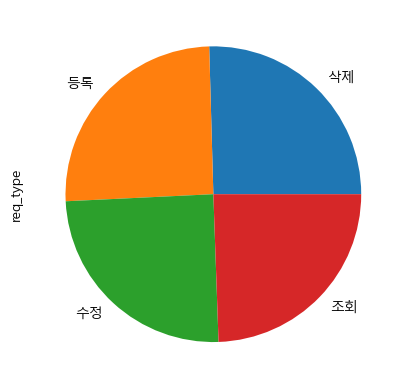

In [18]:
logs['req_type'].value_counts().plot(kind='pie')

<Axes: ylabel='log_type_cd'>

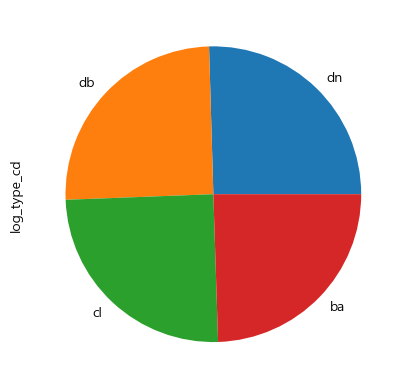

In [22]:
logs['log_type_cd'].value_counts().plot(kind='pie')

<Axes: ylabel='system_seq'>

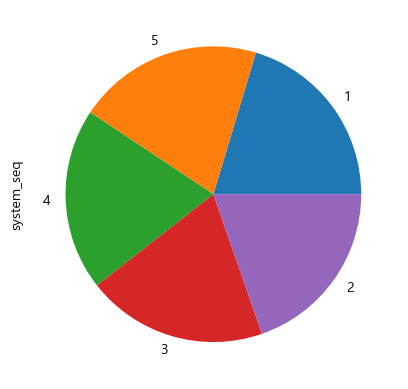

In [23]:
logs['system_seq'].value_counts().plot(kind='pie')

<Axes: ylabel='user_ip'>

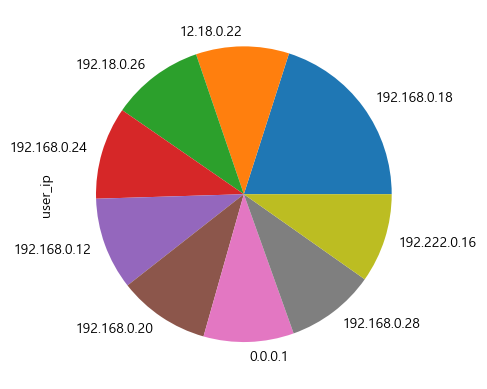

In [37]:
logs['user_ip'].value_counts().plot(kind='pie')

<Axes: ylabel='req_type'>

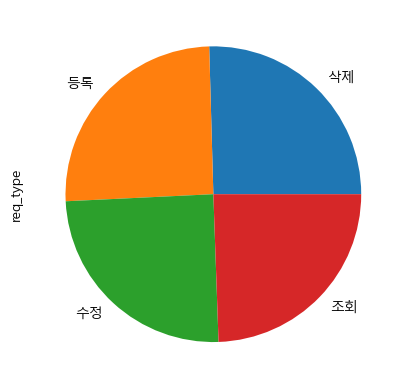

In [36]:
logs['req_type'].value_counts().plot(kind='pie')

In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.log_time, y=df.normal_flag,
                    mode='markers',
                    name='normal_flag'))
fig.update_layout(legend={'title':'normal_flag as log_time'})
fig.update_layout(legend_title_side='top')

fig.update_layout(showlegend=True)
fig.show()

In [20]:
logs

,user_id,log_time,req_type,req_url,log_type_cd,user_ip,system_seq,anomaly_flag
0,USER0,2023-01-01T00:12:03.000Z,등록,www.easycerti.com,cl,192.168.0.18,5,0
1,USER5,2023-01-01T03:02:11.000Z,등록,www.easycerti.com/view/detial,cl,192.222.0.16,1,0
2,USER1,2023-01-01T08:04:23.000Z,조회,www.test.com,dn,192.18.0.26,4,0
3,USER3,2023-01-01T06:13:05.000Z,조회,www.easycerti.com/view/detial,ba,192.168.0.18,1,0
4,USER5,2023-01-01T05:21:18.000Z,조회,www.easycerti.com,ba,192.168.0.18,5,0
...,...,...,...,...,...,...,...,...
19992,USER1,2023-04-03T01:22:00.000Z,조회,localhost:8080/board/qna/detail/view,cl,0.0.0.1,4,0
19993,USER1,2023-04-03T08:17:19.000Z,조회,www.kakao.com,db,192.168.0.12,1,0
19994,USER4,2023-04-03T06:06:00.000Z,조회,www.koera.kr,db,12.18.0.22,5,0
19995,USER6,2023-04-03T06:09:00.000Z,삭제,www.kakao.com,dn,0.0.0.1,5,0


In [21]:
from __future__ import print_function
import keras
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import load_model
from keras.models import  Model
from keras.layers import Dense, Input
import numpy as np

In [26]:
samples = []
for row in logs.iterrows():
    index, data = row
    print( index, data )
    samples.append(data.tolist())

0 user_id                            USER0
log_time        2023-01-01T00:12:03.000Z
req_type                              등록
req_url                www.easycerti.com
log_type_cd                           cl
user_ip                     192.168.0.18
system_seq                             5
anomaly_flag                           0
Name: 0, dtype: object
1 user_id                                 USER5
log_time             2023-01-01T03:02:11.000Z
req_type                                   등록
req_url         www.easycerti.com/view/detial
log_type_cd                                cl
user_ip                          192.222.0.16
system_seq                                  1
anomaly_flag                                0
Name: 1, dtype: object
2 user_id                            USER1
log_time        2023-01-01T08:04:23.000Z
req_type                              조회
req_url                     www.test.com
log_type_cd                           dn
user_ip                      192.18.0.26
system

In [27]:
max_words = 10000
maxlen = 3

In [28]:
samples

[['USER0',
  '2023-01-01T00:12:03.000Z',
  '등록',
  'www.easycerti.com',
  'cl',
  '192.168.0.18',
  '5',
  0],
 ['USER5',
  '2023-01-01T03:02:11.000Z',
  '등록',
  'www.easycerti.com/view/detial',
  'cl',
  '192.222.0.16',
  '1',
  0],
 ['USER1',
  '2023-01-01T08:04:23.000Z',
  '조회',
  'www.test.com',
  'dn',
  '192.18.0.26',
  '4',
  0],
 ['USER3',
  '2023-01-01T06:13:05.000Z',
  '조회',
  'www.easycerti.com/view/detial',
  'ba',
  '192.168.0.18',
  '1',
  0],
 ['USER5',
  '2023-01-01T05:21:18.000Z',
  '조회',
  'www.easycerti.com',
  'ba',
  '192.168.0.18',
  '5',
  0],
 ['USER5',
  '2023-01-01T01:20:04.000Z',
  '삭제',
  'www.koera.kr',
  'dn',
  '192.168.0.12',
  '4',
  0],
 ['USER0',
  '2022-12-31T23:20:03.000Z',
  '수정',
  'www.test.com',
  'db',
  '192.168.0.28',
  '5',
  0],
 ['USER1',
  '2023-01-01T02:08:16.000Z',
  '수정',
  'www.koera.kr',
  'dn',
  '0.0.0.1',
  '3',
  0],
 ['USER9',
  '2023-01-01T04:02:10.000Z',
  '삭제',
  'www.kakao.com',
  'cl',
  '192.222.0.16',
  '5',
  0],
 ['USER

In [29]:
# Tokenize values.
tokenizer = Tokenizer(num_words=max_words, lower=False)
tokenizer.fit_on_texts(samples)
sequences = tokenizer.texts_to_sequences(samples)

max_len = max(len(item) for item in sequences)

word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))
data = pad_sequences(sequences, maxlen=maxlen)

Found 19711 unique tokens.


In [30]:
data

array([[12, 11,  1],
       [42, 10,  1],
       [20, 13,  1],
       ...,
       [18, 11,  1],
       [38, 11,  1],
       [20, 14,  1]])

In [31]:
# Split data into training and test set. 
training_samples = int(len(samples) * 0.90)
test_samples = int(len(samples) * 0.10)

In [32]:
x = data[:training_samples]
x_test = data[training_samples: training_samples + test_samples]

In [33]:
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath='log_model-testing.h5',
    monitor='val_loss',
    save_best_only=True
    )
]

In [34]:
# Create model.
input_dim = x.shape[1]
input = Input(shape=(input_dim, ))
encode = Dense(2, activation='relu')(input)
encode = Dense(1, activation='relu')(encode)

decode = Dense(2, activation='relu')(encode)
decode = Dense(3, activation='sigmoid')(decode)

autoencoder = Model(input, decode)

autoencoder.summary()

autoencoder.compile(optimizer='adam',
            loss='mean_squared_error',
            metrics=['accuracy'])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense (Dense)               (None, 2)                 8         
                                                                 
 dense_1 (Dense)             (None, 1)                 3         
                                                                 
 dense_2 (Dense)             (None, 2)                 4         
                                                                 
 dense_3 (Dense)             (None, 3)                 9         
                                                                 
Total params: 24
Trainable params: 24
Non-trainable params: 0
_________________________________________________________________


In [20]:
# Train model.
history = autoencoder.fit(x, x,
        epochs=50,
        batch_size=32,
        callbacks=callbacks_list,
        validation_data=(x_test, x_test),
        shuffle=True
        )

Epoch 1/50
563/563 [==============================] - 2s 3ms/step - loss: 793.2966 - accuracy: 0.4664 - val_loss: 768.3660 - val_accuracy: 0.8259
Epoch 2/50
563/563 [==============================] - 1s 2ms/step - loss: 788.8126 - accuracy: 0.8174 - val_loss: 764.4857 - val_accuracy: 0.8259
Epoch 3/50
563/563 [==============================] - 1s 2ms/step - loss: 785.4596 - accuracy: 0.8174 - val_loss: 761.7368 - val_accuracy: 0.8259
Epoch 4/50
563/563 [==============================] - 1s 2ms/step - loss: 783.1451 - accuracy: 0.8174 - val_loss: 759.8749 - val_accuracy: 0.8259
Epoch 5/50
563/563 [==============================] - 1s 2ms/step - loss: 781.5761 - accuracy: 0.8174 - val_loss: 758.6061 - val_accuracy: 0.8259
Epoch 6/50
563/563 [==============================] - 1s 2ms/step - loss: 780.4994 - accuracy: 0.8174 - val_loss: 757.7261 - val_accuracy: 0.8259
Epoch 7/50
563/563 [==============================] - 1s 2ms/step - loss: 779.7441 - accuracy: 0.8174 - val_loss: 757.1008 -

In [21]:
import pandas as pd
from numpy import vstack

# Combined x and x_test.
new_x = vstack([x, x_test])

predictions = autoencoder.predict(new_x)

# Calculated MSE.
mse = np.mean(np.power(new_x - predictions, 2), axis=1)
error_df = pd.DataFrame({'reconstruction_error': mse})

# Set threshold at the 99th quartile.
threshold = error_df.quantile(0.99)

error_df.describe()

625/625 [==============================] - 1s 1ms/step


,reconstruction_error
count,19996.000000
mean,775.281583
std,711.281816
min,67.333359
25%,217.666711
50%,406.666725
75%,1523.333430
max,3287.000313


(array([8237., 4892.,    0.,  369., 5102.,  590.,  264.,  134.,    0.,
         408.]),
 array([  67.33335876,  389.30005419,  711.26674962, 1033.23344505,
        1355.20014048, 1677.1668359 , 1999.13353133, 2321.10022676,
        2643.06692219, 2965.03361762, 3287.00031304]),
 <BarContainer object of 10 artists>)

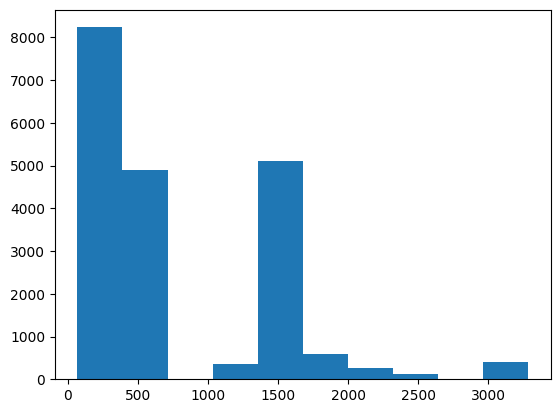

In [22]:
%matplotlib inline
import matplotlib.pyplot as plt

# Reconstruction error binned and plotted.
fig = plt.figure()
ax = fig.add_subplot(111)
# ax.hist(error_df.reconstruction_error.values, bins=7)
ax.hist(error_df.reconstruction_error.values)

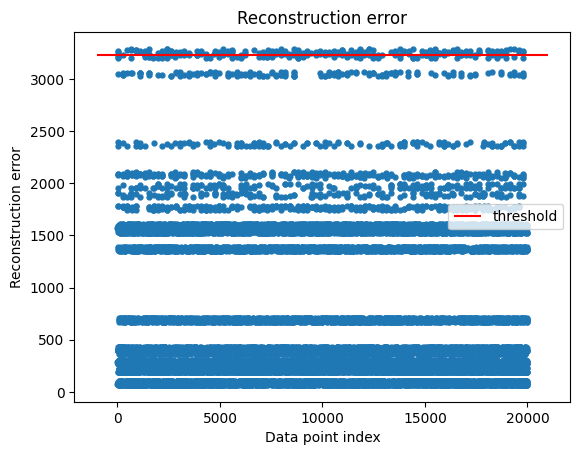

In [23]:
threshold = threshold

# Plot reconstruction error vs. the data.
fig, ax = plt.subplots()
ax.plot(error_df.index, error_df.reconstruction_error, marker='o', ms=3.5, linestyle='')
ax.hlines(threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="r", zorder=100, label='threshold')
ax.legend(loc=5)
plt.title("Reconstruction error")
plt.ylabel("Reconstruction error")
plt.xlabel("Data point index")
plt.show()

In [24]:
# Output anomalies.
index_list = []
for index, row in error_df.iterrows():
    if row.reconstruction_error > int(threshold):
        index_list.append(index)

output = []    
for x in index_list:
    output.append(new_x[x])
  

for x in output:
    print( 'len( x ) : ', len(x) )
    for key, value in word_index.items():
        if value == x[2]:
            print(key)
        if value == x[1]:
            print(key)
        if value == x[0]:
            print(key)
    print('----------------------------------')

C:\Users\user\AppData\Local\Temp\ipykernel_27372\1958411865.py:4: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  if row.reconstruction_error > int(threshold):


4
192.222.0.16
1
----------------------------------
4
192.168.0.28
1
----------------------------------
5
192.222.0.16
1
----------------------------------
4
192.168.0.28
1
----------------------------------
3
192.222.0.16
1
----------------------------------
2
192.222.0.16
1
----------------------------------
3
192.222.0.16
1
----------------------------------
3
192.222.0.16
1
----------------------------------
4
192.222.0.16
1
----------------------------------
3
192.222.0.16
1
----------------------------------
4
192.222.0.16
1
----------------------------------
2
192.168.0.28
1
----------------------------------
4
192.222.0.16
1
----------------------------------
1
192.222.0.16
1
----------------------------------
4
192.168.0.28
1
----------------------------------
3
192.168.0.28
1
----------------------------------
3
192.168.0.28
1
----------------------------------
2
192.168.0.28
1
----------------------------------
2
192.222.0.16
1
----------------------------------
1
192.222.0.

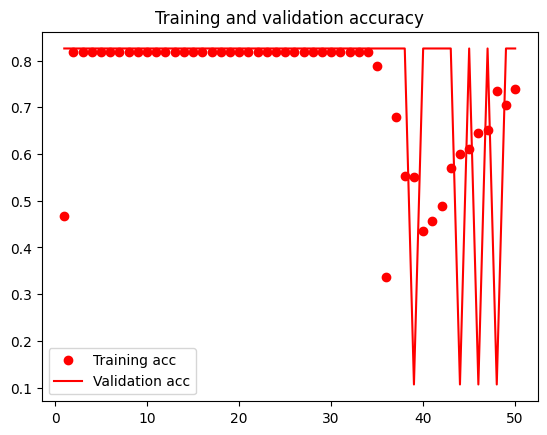

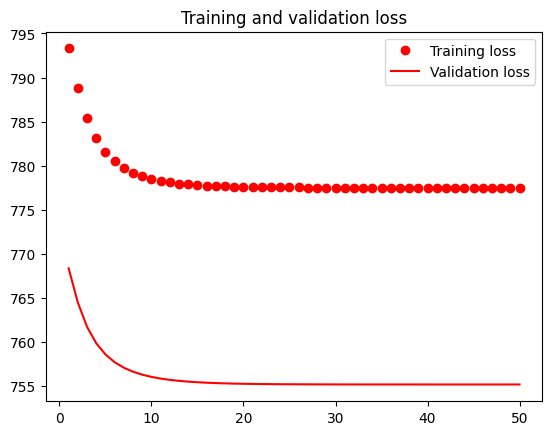

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1 , len(acc) + 1)

plt.plot(epochs, acc, 'ro', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [26]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [27]:
df.normal_flag.unique()

array([0, 1], dtype=int64)

In [28]:
df[df['normal_flag'] == 1].shape

(1396, 14)

In [29]:
df[df['normal_flag'] == 0].shape

(18601, 14)

In [30]:
len(new_x), len( output ), max_len

(19996, 209, 11)

In [31]:
new_x

array([[12, 11,  1],
       [69, 10,  1],
       [28, 13,  1],
       ...,
       [34, 10,  1],
       [23, 11,  1],
       [64, 11,  1]])

In [32]:
word_index

{0: 1,
 'dn': 2,
 '삭제': 3,
 '등록': 4,
 'db': 5,
 'cl': 6,
 '수정': 7,
 'ba': 8,
 '조회': 9,
 '1': 10,
 '5': 11,
 '192.168.0.18': 12,
 '4': 13,
 '3': 14,
 '2': 15,
 'DEPT10003': 16,
 '부서명10003': 17,
 'USER7': 18,
 '이름7': 19,
 'DEPT10010': 20,
 '부서명10010': 21,
 'www.test.com': 22,
 '12.18.0.22': 23,
 'USER5': 24,
 '이름5': 25,
 'DEPT10008': 26,
 '부서명10008': 27,
 '192.18.0.26': 28,
 'USER4': 29,
 '이름4': 30,
 'DEPT10007': 31,
 '부서명10007': 32,
 '192.168.0.24': 33,
 '192.168.0.12': 34,
 'www.easycerti.com/view/detial': 35,
 'USER3': 36,
 '이름3': 37,
 'DEPT10006': 38,
 '부서명10006': 39,
 'USER6': 40,
 '이름6': 41,
 'DEPT10009': 42,
 '부서명10009': 43,
 'localhost:8080/board/qna/detail/view': 44,
 '192.168.0.20': 45,
 'localhost:8080/board/notice/list/view': 46,
 'www.intel.com': 47,
 'www.naver.com': 48,
 'USER2': 49,
 '이름2': 50,
 'DEPT10005': 51,
 '부서명10005': 52,
 'USER1': 53,
 '이름1': 54,
 'DEPT10004': 55,
 '부서명10004': 56,
 'www.koera.kr': 57,
 'www.daum.com': 58,
 'USER8': 59,
 '이름8': 60,
 'DEPT10011': 61

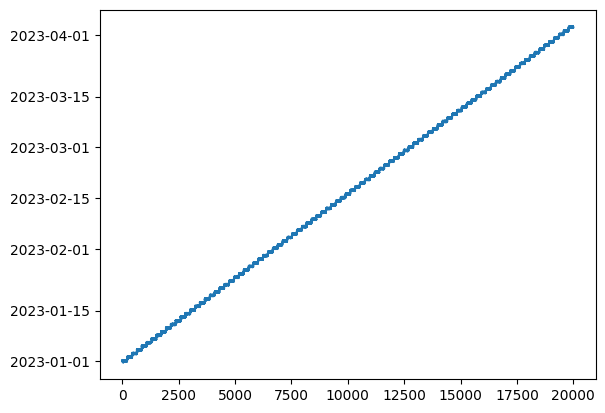

In [33]:
fig, ax = plt.subplots()
df['log_time'].plot(legend=False, ax=ax)
plt.show()

In [34]:
output

[array([69, 13, 72]),
 array([68, 13, 72]),
 array([69, 11, 72]),
 array([68, 13, 72]),
 array([69, 14, 72]),
 array([69, 15, 72]),
 array([69, 14, 72]),
 array([69, 14, 72]),
 array([69, 13, 72]),
 array([69, 14, 72]),
 array([69, 13, 72]),
 array([68, 15, 72]),
 array([69, 13, 72]),
 array([69, 10, 72]),
 array([68, 13, 72]),
 array([68, 14, 72]),
 array([68, 14, 72]),
 array([68, 15, 72]),
 array([69, 15, 72]),
 array([69, 10, 72]),
 array([69, 10, 72]),
 array([69, 13, 72]),
 array([68, 14, 72]),
 array([69, 14, 72]),
 array([69, 15, 72]),
 array([69, 15, 72]),
 array([68, 14, 72]),
 array([69, 13, 72]),
 array([68, 13, 72]),
 array([69, 13, 72]),
 array([69, 11, 72]),
 array([68, 14, 72]),
 array([69, 11, 72]),
 array([68, 14, 72]),
 array([69, 13, 72]),
 array([68, 13, 72]),
 array([68, 15, 72]),
 array([69, 10, 72]),
 array([68, 13, 72]),
 array([69, 13, 72]),
 array([68, 14, 72]),
 array([68, 13, 72]),
 array([69, 11, 72]),
 array([68, 15, 72]),
 array([69, 13, 72]),
 array([68

In [35]:
x.shape

(3,)